# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

import time
from tqdm.notebook import tqdm
import requests

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = '../../data/DE/ANOVA_mean/'

In [3]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [4]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown']

In [5]:
os.listdir(de_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'ttest_mamm_mean.csv']

## Load files

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_mean.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,0.122578,12.0,2.796490,0.003701,0.010364
AAAS,0.017527,12.0,0.944161,0.509517,0.596369
AACS,0.136394,12.0,2.729393,0.004508,0.012212
AADAT,0.057031,12.0,5.478881,0.000002,0.000016
AAGAB,0.043359,12.0,2.127609,0.026045,0.053640


In [7]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels
anova_labels.name = 'ANOVA_labels'

## Load normalized pseudobulks

In [8]:
pb_dir_path = 'results/'

In [9]:
os.listdir(pb_dir_path)

['.ipynb_checkpoints',
 'ancova_3df_res.pkl',
 'ancova_perm_res.pkl',
 'ancova_res.pkl',
 'celltypes.csv',
 'chimp_clusters_28.csv',
 'chimp_clusters_50.csv',
 'chimp_clusters_77.csv',
 'chimp_clusters_ancova.csv',
 'colors.csv',
 'constypes.csv',
 'cs_genes_cluster0.pdf',
 'cs_genes_cluster1.pdf',
 'cs_genes_cluster2.pdf',
 'cs_genes_cluster3.pdf',
 'cs_genes_cluster4.pdf',
 'gene_selection_df.csv',
 'hs_anova_inter_clusters.csv',
 'hs_genes_cluster0.pdf',
 'hs_genes_cluster1.pdf',
 'hs_genes_cluster2.pdf',
 'hs_genes_cluster3.pdf',
 'hs_genes_cluster4.pdf',
 'hs_genes_cluster5.pdf',
 'hs_genes_cluster6.pdf',
 'hs_layers.csv',
 'hs_prof.csv',
 'hs_prof_anova.csv',
 'hs_ttest_inter_clusters.csv',
 'human_clusters_28.csv',
 'human_clusters_50.csv',
 'human_clusters_67.csv',
 'human_clusters_77.csv',
 'human_clusters_ancova.csv',
 'human_clusters_ancova_01_cos_all_10.csv',
 'human_clusters_ancova_01_cos_all_6.csv',
 'human_clusters_ancova_01_cos_all_7.csv',
 'human_clusters_ancova_01_cos

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean_filtered.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 5390
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

In [11]:
background_genes = adata_pb_norm.var_names.tolist()
len(background_genes)

5390

## Specie-specific genes

In [12]:
model_res = pd.read_csv('results/gene_selection_df.csv', index_col=0)
model_res.head()

,human,chimp,macaque
AACS,0.001206,0.014287,0.318736
AAGAB,0.731575,0.661344,0.024143
AAK1,0.000658,0.699175,0.069657
AAMP,0.762617,0.530339,0.947528
AAR2,0.312623,0.436571,0.343371


In [13]:
import pickle
with open("results/ancova_perm_res.pkl", "rb") as file:
    ancova_results = pickle.load(file)

In [14]:
# import pickle
# with open("./results/specie_specific_genes_tr50.pkl", "rb") as file:
#     genes_dict77 = pickle.load(file)

In [15]:
sign_genes = {key:value[value['p-value'] < 0.05].index for key, value in ancova_results.items()}
sign_genes

{'human-chimp': Index(['ABCG4', 'ABHD6', 'ABI2', 'ABLIM3', 'ACHE', 'ACSL1', 'ACTG1', 'ACTN2',
        'ADAM15', 'ADGRB2',
        ...
        'ZEB2', 'ZFPL1', 'ZMYND8', 'ZNF32', 'ZNF362', 'ZNF608', 'ZNF689',
        'ZNF692', 'ZNF706', 'ZNF74'],
       dtype='object', length=786),
 'human-macaque': Index(['AACS', 'AAGAB', 'AAK1', 'AAR2', 'AARS1', 'AATK', 'ABAT', 'ABCC10',
        'ABCD4', 'ABHD10',
        ...
        'ZNF575', 'ZNF576', 'ZNF592', 'ZNF593', 'ZNF655', 'ZNF689', 'ZNF703',
        'ZNF706', 'ZNF768', 'ZNFX1'],
       dtype='object', length=2085),
 'chimp-macaque': Index(['AARS1', 'AATK', 'ABAT', 'ABCC10', 'ABCC8', 'ABCD4', 'ABHD10', 'ABLIM3',
        'ACAD9', 'ACADVL',
        ...
        'ZNF184', 'ZNF189', 'ZNF304', 'ZNF341', 'ZNF511', 'ZNF536', 'ZNF576',
        'ZNF655', 'ZNF689', 'ZNF703'],
       dtype='object', length=1562)}

Попробуем определить человеко-специфичные гены как $(HC\bigcap HM)\setminus CM$

In [16]:
hs_genes = sign_genes['human-chimp'].intersection(sign_genes['human-macaque']).difference(sign_genes['chimp-macaque'])
hs_genes, hs_genes.size

(Index(['ABHD6', 'ABI2', 'ADAM15', 'ADI1', 'ADORA1', 'AFTPH', 'AHNAK2', 'ALCAM',
        'AMFR', 'ANK2',
        ...
        'VIPAS39', 'VLDLR', 'WWP1', 'YWHAE', 'YWHAH', 'ZBTB18', 'ZBTB46',
        'ZEB2', 'ZNF362', 'ZNF706'],
       dtype='object', length=230),
 230)

## Helpful functions

In [17]:
def p_val_group(value):
    if value >= 0.05:
        return 'No significance'
    elif  0.01 <= value < 0.05:
        return 'p < 0.05'
    elif  0.001 <= value < 0.01:
        return 'p < 0.01'
    else:
        return 'p < 0.001'

In [18]:
color_discrete_map = {'No significance': 'darkblue',
                      'p < 0.05': 'purple',
                      'p < 0.01': 'darkorange',
                      'p < 0.001': 'yellow'}

In [19]:
class GeneCluster:
    def __init__(self, genes, descr, label, background_genes, **kwargs):
        self.label = label
        self.genes = genes
        self.descr = descr
        self.background_genes = background_genes
        self.userlist_id = self._get_userlist_id()
        self.background_id = self._get_background_id()
        self.enrichment_res = dict()

    
    def _get_userlist_id(self):
        base_url = "https://maayanlab.cloud/speedrichr"

        description = "sample gene set with background"

        res = requests.post(
            base_url+'/api/addList',
            files=dict(
              list=(None, '\n'.join(self.genes)),
              description=(None, description),
            )
          )
        if res.ok:
            userlist_response = res.json()
        else:
            raise Exception('Error analyzing gene list')
        return userlist_response['userListId']
    
    def _get_background_id(self):
        base_url = "https://maayanlab.cloud/speedrichr"

        res = requests.post(
            base_url+'/api/addbackground',
            data=dict(background='\n'.join(self.background_genes))
        )

        if res.ok:
            background_response = res.json()
        else:
            raise Exception('Error analyzing gene list')
        return background_response['backgroundid']

    def enrich(self, gene_set_library):
        # get enrichment results
        base_url = "https://maayanlab.cloud/speedrichr"

        res = requests.post(
                base_url+'/api/backgroundenrich',
                data=dict(
                userListId=self.userlist_id,
                backgroundid=self.background_id,
                backgroundType=gene_set_library,
                )
            )
        if res.ok:
            data = res.json()
        else:
            raise Exception('Error analyzing gene list')
        # convert results to df
        columns = ['Rank', 'Term', 'p-val', 'Z-score', 'Combined score', 'Overlapping genes', 'Adjusted P-value', 'Old p-value', 'Old adjusted p-value']
        results = pd.DataFrame(data[gene_set_library], columns=columns)
        # preprocess df
        results.Term = results.Term.astype(str)
        results['num_overlap_genes'] = results['Overlapping genes'].apply(lambda x: len(x))
        results['neg_log10(p_adj)'] = - np.log10(results['Adjusted P-value'])
        results['cluster_label'] = self.label
        # save to enrichment_res
        self.enrichment_res[gene_set_library] = results

    @staticmethod
    def enrich_geneclusters(geneclusters, gene_set_library):
        for gc in geneclusters:
            gc.enrich(gene_set_library)

# Clusterisation

In [20]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)

In [21]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df[hs_genes].copy()

## Hierarchial

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


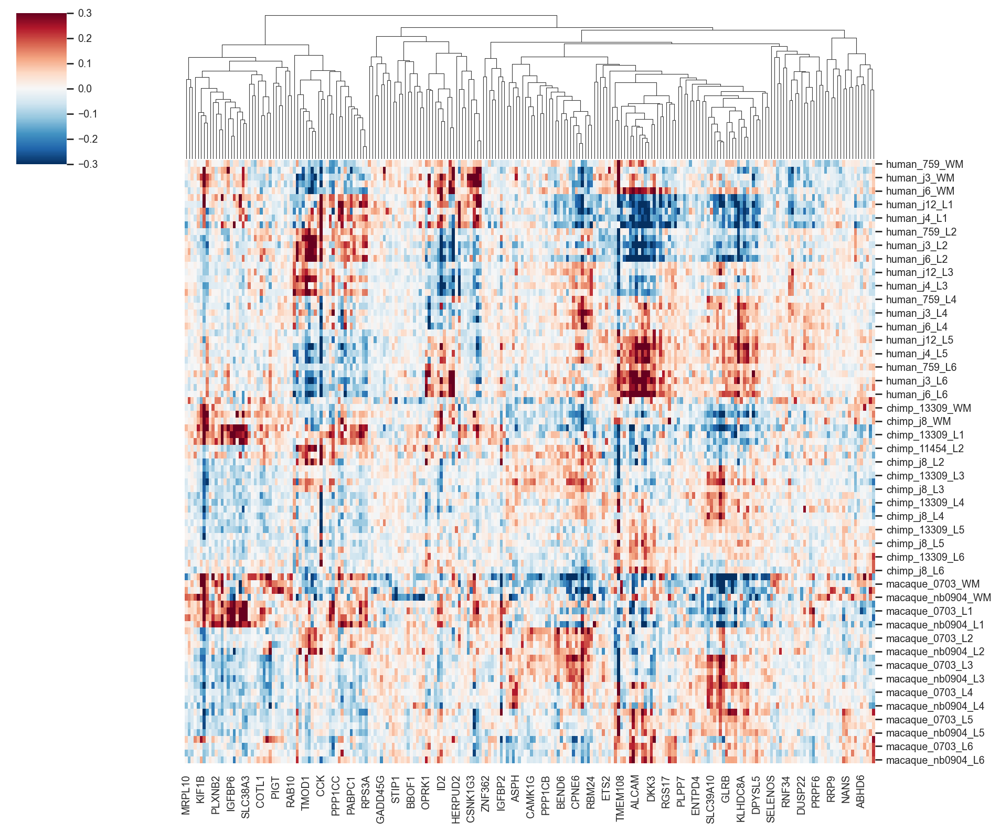

In [22]:
sns.set(font_scale=0.8)
sns.clustermap(df_hs, figsize=(12, 10), cmap="RdBu_r", center=0, vmax=0.3, vmin=-0.3, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

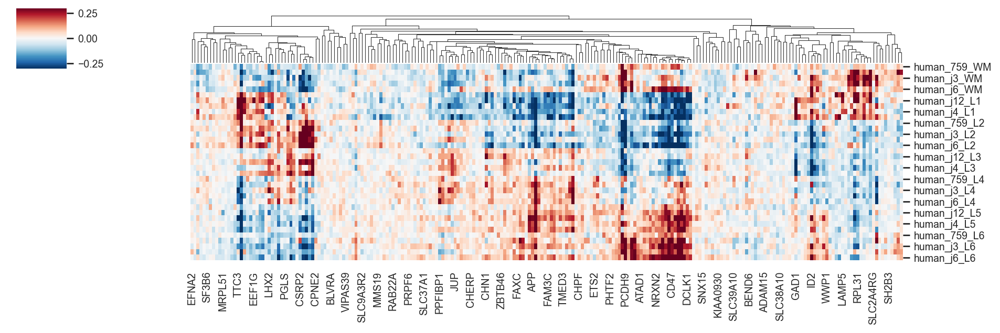

In [23]:
sns.clustermap(df_hs.loc[sample_order['human']], figsize=(12, 4), cmap="RdBu_r", center=0, vmax=0.3, vmin=-0.3, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

## Spectral clusterisation

In [24]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df_hs.T, metric='cosine') + 1
n_clusters = 15
#clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=4)
clustering = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)
#clustering.fit(df_hs.T[sample_order['human']])
#clustering.fit(df_hs.T)

SpectralClustering(affinity='precomputed', n_clusters=15, random_state=4)

In [25]:
labels = pd.Series(clustering.labels_, index=hs_genes).sort_values()
order = labels.sort_values().index

In [117]:
labels.to_csv(f'./results/human_clusters_ancova_05_cos_all_{n_clusters}.csv')

In [27]:
cluster_color = ['red', 'yellow', 'orange', 'green', 'purple', 'blue', 'olive', 'pink', 'brown', 'cyan', 'pink', 'violet', 'crimson', 'tab:red', 'tab:green']

In [28]:
colors = cluster_color[:n_clusters]
clusters = np.arange(n_clusters)

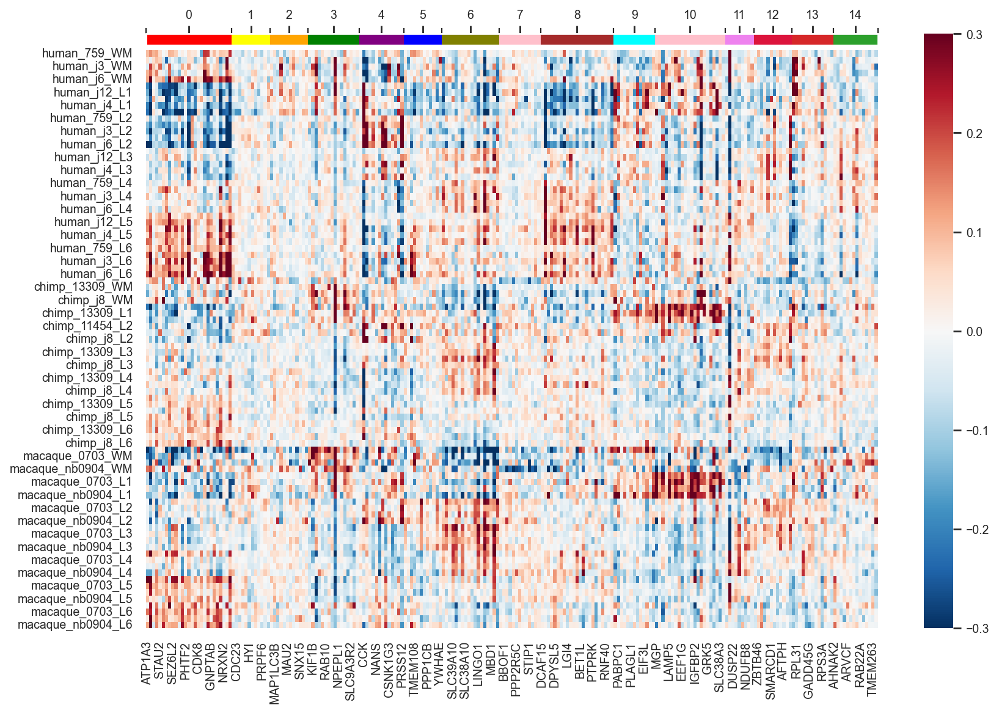

In [29]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df_hs[order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

In [30]:
labels[labels == 1].size

12

## Cluster profiles

In [31]:
df_annotation = df_hs.copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [32]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ABHD6      ABI2    ADAM15      ADI1    ADORA1     AFTPH  \
condition layer                                                               
chimp     L1    -0.128820 -0.059771  0.120247  0.232106 -0.142581 -0.002926   
          L2     0.081598  0.010944 -0.003475 -0.029761 -0.145785  0.063356   
          L3    -0.039633  0.062355 -0.044347 -0.081698 -0.120843  0.044030   
          L4     0.020756  0.020539 -0.039034 -0.069586  0.006139  0.001397   
          L5     0.006443 -0.015000 -0.052907 -0.055009  0.065859 -0.012946   

                   AHNAK2     ALCAM      AMFR      ANK2  ...   VIPAS39  \
condition layer                                          ...             
chimp     L1    -0.091653  0.009130  0.083703 -0.074303  ... -0.059544   
          L2    -0.052059 -0.242804  0.070298 -0.107423  ...  0.045883   
          L3    -0.010910 -0.066325 -0.016274 -0.046509  ... -0.000079   
          L4     0.062326  0.006249 -0.060398 -0.037624  ...  0.029193   
          L5     0.082473  0.134409 -0.049253 -0.015614  ... -0.027980   

                    VLDLR      WWP1     YWHAE     YWHAH    ZBTB18    ZBTB46  \
condition layer                                                               
chimp     L1    -0.015714 -0.021681 -0.043822 -0.213943 -0.154330  0.026107   
          L2     0.094521  0.075032  0.006897 -0.006026  0.229193  0.072883   
          L3     0.069694 -0.028285  0.031802  0.053368  0.178206  0.070541   
          L4    -0.048778 -0.005638  0.006790  0.066827  0.129230  0.024286   
          L5    -0.039212  0.002174  0.007214  0.060298  0.023022 -0.064324   

                     ZEB2    ZNF362    ZNF706  
condition layer                                
chimp     L1     0.037896  0.034277  0.020416  
          L2     0.051170 -0.024460  0.121583  
          L3    -0.040480  0.001123  0.067006  
          L4    -0.075607 -0.028787 -0.001815  
          L5    -0.057856  0.018199 -0.035676  

[5 rows x 230 columns]

In [33]:
# fig, axes = plt.subplots(2, 2,  figsize=(14, 3.5 * 2), gridspec_kw={'hspace': 0.4})
# for gene, ax in zip(layer_mean.columns, axes.flatten()):
#     (
#             layer_mean[gene]
#             .reorder_levels(['layer', 'condition'])
#             .unstack().loc[layers]
#             .plot
#             .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
#     )
#     ax.grid(False)

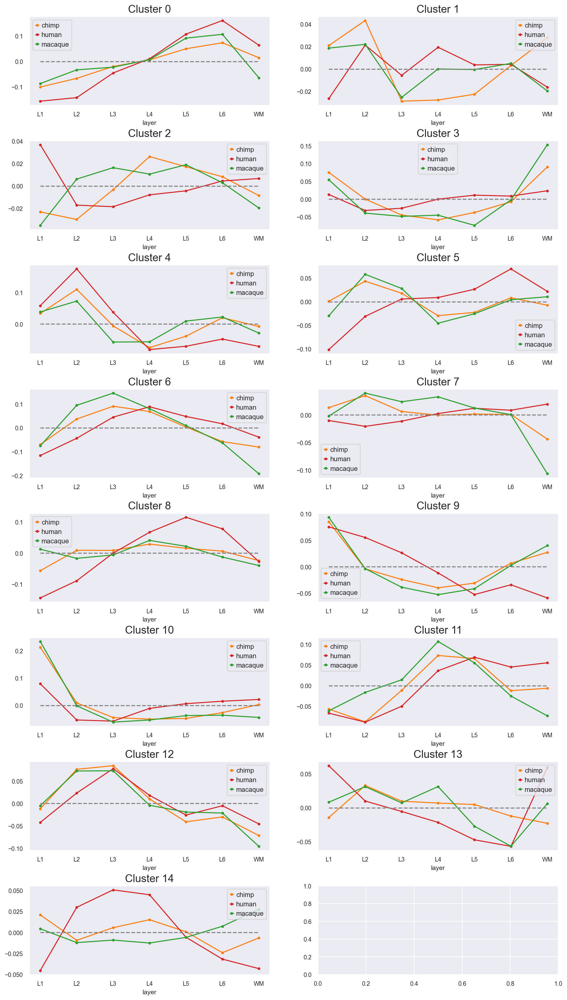

In [34]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

Text(0.5, 0.98, 'Median averaging for profiles')

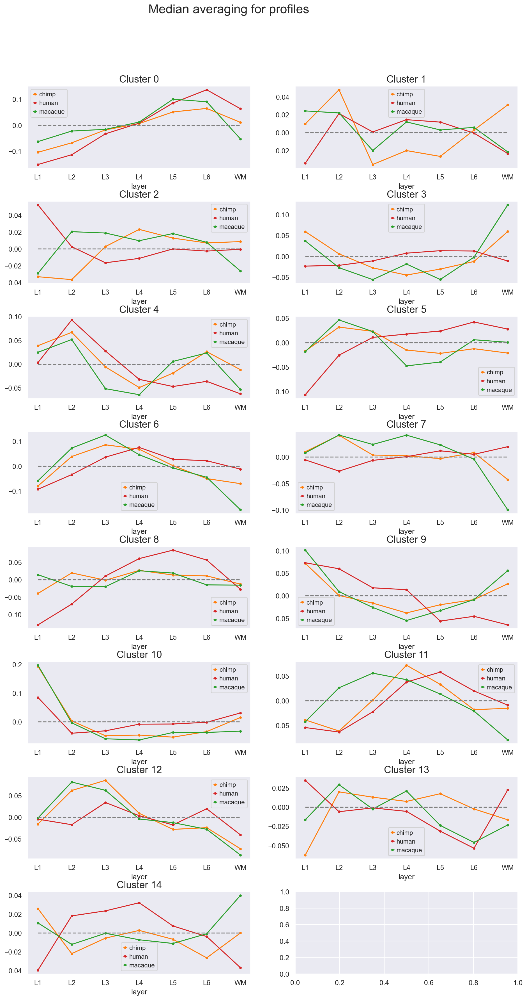

In [35]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .median(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

fig.suptitle('Median averaging for profiles', fontsize=20)

### Cell types

# 4 Species

In [36]:
pb_dir_path = '../../data/pseudobulks/'
adata_pb_4spe = sc.read_h5ad(pb_dir_path + '4spe_pb_mean_filt_nor_mean.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_4spe

AnnData object with n_obs × n_vars = 116 × 6523
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'gene_name'
    uns: 'log1p'

In [37]:
df_4spe = pd.DataFrame(adata_pb_4spe.X, index=adata_pb_4spe.obs_names, columns=adata_pb_4spe.var_names)

In [38]:
hs_genes_inter = df_4spe.columns.intersection(hs_genes)
hs_genes_inter.size

154

In [39]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque', 'treeshrew']:
    samples = df_4spe.loc[df_4spe.index.str.contains(cond)].index
    order_s = sorted(samples.tolist(), key=lambda x: x[:2])
    order_laminar = list(filter(lambda x: 'L' in x, order_s))
    order_wm = list(filter(lambda x: 'WM' in x, order_s))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque'] + sample_order['treeshrew']
df_4spe = df_4spe.loc[sample_order['all']]
df_4spe_hs = df_4spe[hs_genes_inter]

In [40]:
order_4spe = order.intersection(hs_genes_inter)

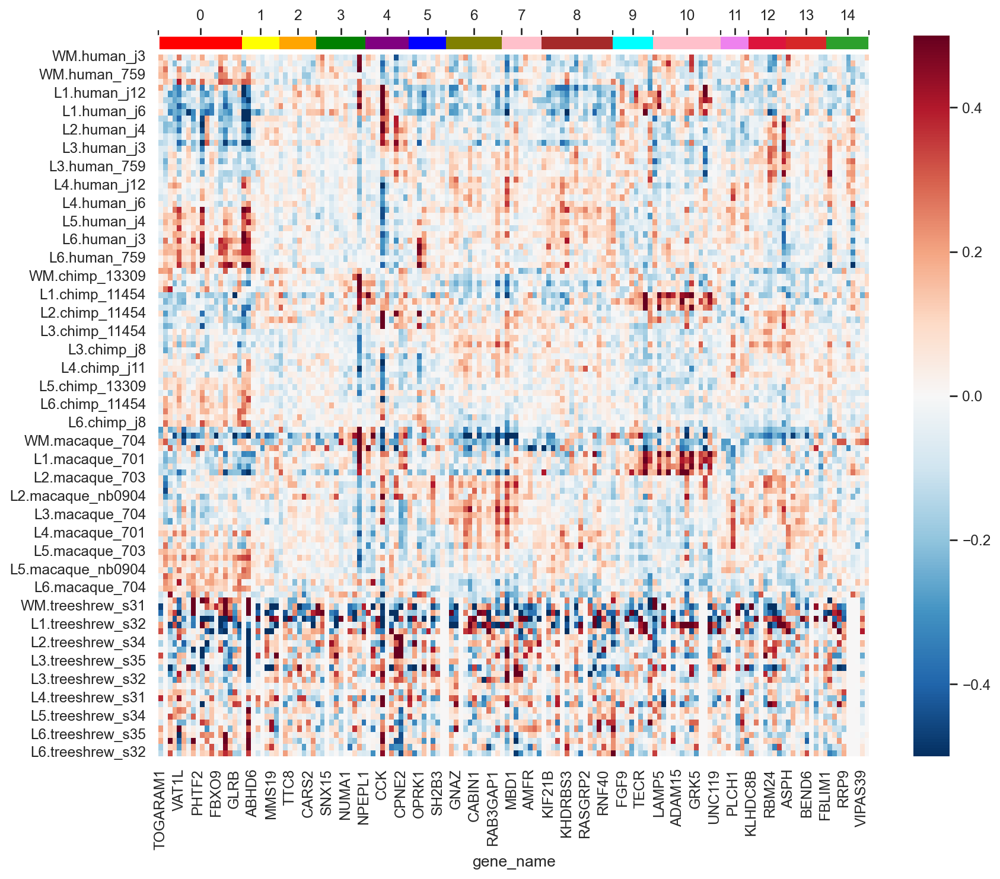

In [41]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(df_4spe_hs[order_4spe], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)
divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='2%', pad=0.05)
cmap = mpl.colors.ListedColormap(colors)

cluster_size = labels.value_counts().loc[clusters].values
cluster_pos = cluster_size.cumsum()
bounds = [0] + list(cluster_pos)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
fig.colorbar(
    mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
    cax=cax,
    ticks=bounds,
    orientation='horizontal',
    spacing='proportional'
)
cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
cax.xaxis.tick_top()

## Cluster profiles (mean)

In [42]:
df_annotation = df_4spe_hs.copy()
df_annotation['layer'] = adata_pb_4spe.obs.layer
df_annotation['condition'] = adata_pb_4spe.obs.condition

In [43]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

gene_name          GPR153    FBLIM1    IGSF21    ZNF362    SLC2A1       HYI  \
condition layer                                                               
chimp     6a          NaN       NaN       NaN       NaN       NaN       NaN   
          L1     0.170319  0.080998 -0.231617  0.064203  0.549012  0.095937   
          L2     0.103709 -0.076954 -0.164320 -0.014871 -0.105929  0.035265   
          L3     0.135652  0.004237 -0.013440  0.000755 -0.085139 -0.019817   
          L4    -0.021479 -0.004656  0.176425 -0.038331 -0.159376 -0.102893   

gene_name          ADAM15    KIF21B    ADORA1   KLHDC8A  ...      GNAZ  \
condition layer                                          ...             
chimp     6a          NaN       NaN       NaN       NaN  ...       NaN   
          L1     0.142487 -0.061434 -0.160815 -0.203626  ... -0.039300   
          L2    -0.007318  0.055080 -0.223321 -0.038123  ...  0.123926   
          L3    -0.062504  0.114423 -0.185453  0.010068  ...  0.102861   
          L4    -0.046611  0.066458 -0.005093  0.023488  ...  0.079627   

gene_name          CABIN1    ASPHD2      TSPO  KIAA0930    PLXNB2     NCAM2  \
condition layer                                                               
chimp     6a          NaN       NaN       NaN       NaN       NaN       NaN   
          L1     0.007308 -0.039383  0.156637  0.000218  0.229904  0.075177   
          L2     0.034510  0.071358 -0.074830 -0.029361  0.058206  0.041594   
          L3     0.015382  0.092665 -0.067673 -0.041037 -0.121396 -0.014084   
          L4    -0.018344  0.007259 -0.098315 -0.017627 -0.165143 -0.011287   

gene_name            JAM2       APP      ETS2  
condition layer                                
chimp     6a          NaN       NaN       NaN  
          L1     0.285189 -0.117498  0.189577  
          L2    -0.111063 -0.100191 -0.086869  
          L3    -0.064058  0.082678 -0.065697  
          L4    -0.068254  0.083122  0.099880  

[5 rows x 154 columns]

Text(0.5, 0.98, 'Mean averaging for profiles')

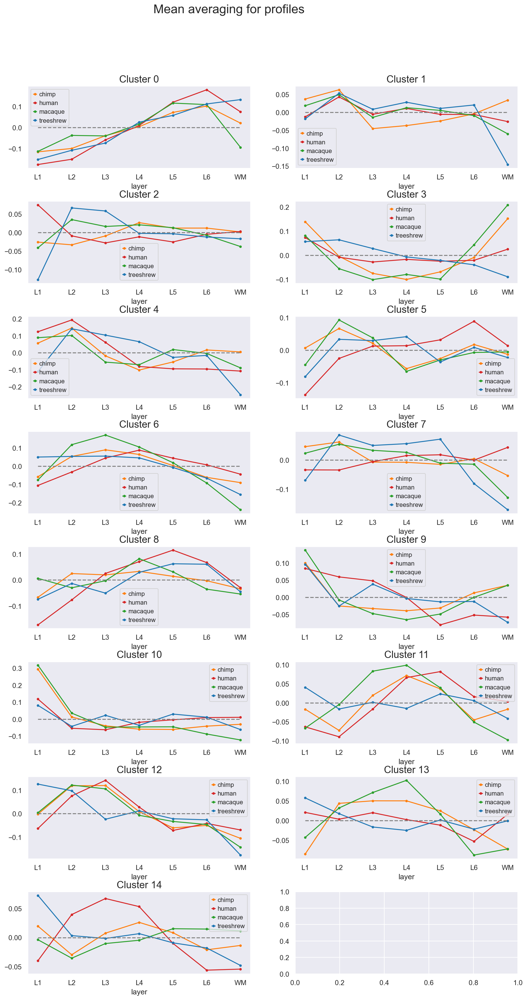

In [44]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.intersection(hs_genes_inter).tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

fig.suptitle('Mean averaging for profiles', fontsize=20)

## Cluster profiles (Median)

Text(0.5, 0.98, 'Median averaging for profiles')

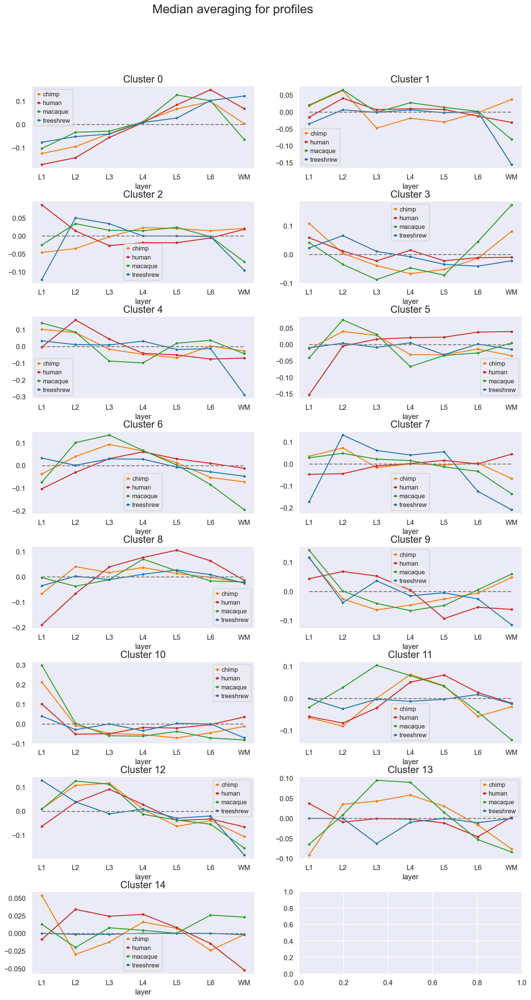

In [45]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.intersection(hs_genes_inter).tolist()

    (
        layer_mean[genes]
        .median(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

fig.suptitle('Median averaging for profiles', fontsize=20)

In [46]:
# sns.set(font_scale=1)
# label = 3
# genes = hs_genes_inter.tolist()
# fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

# for gene, ax in zip(genes, axes.flatten()):
#     (
#         layer_mean[gene]
#         .reorder_levels(['layer', 'condition'])
#         .unstack().loc[layers]
#         .plot
#         .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
#     )
#     ax.legend(fontsize=10)
#     ax.set_title(f'{gene}', fontsize=16)
#     ax.grid(False)
#     ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
# plt.savefig('hs_genes_profiles.pdf')

In [47]:
cs_genes = sign_genes['chimp-macaque'].intersection(sign_genes['human-chimp']).difference(sign_genes['human-macaque'])
cs_genes, cs_genes.size

(Index(['ACHE', 'ACTN2', 'ANK3', 'ANKIB1', 'ARF5', 'ARID4A', 'ARID4B', 'AZIN2',
        'BAIAP2', 'BTF3', 'CAMK2G', 'COBL', 'CTDNEP1', 'DCAKD', 'DCBLD2',
        'DENND4B', 'DNAJB6', 'DYNC1I2', 'DYNC1LI1', 'ENOX1', 'FAM71E1',
        'FAM76A', 'FAU', 'GIPC1', 'GOLPH3', 'HCCS', 'HEY1', 'HINT1', 'HINT2',
        'HMGCLL1', 'HNRNPA3', 'HSPB11', 'KCNC2', 'KLF3', 'KXD1', 'LCMT1',
        'LRP3', 'LSM5', 'MAP3K7', 'METTL5', 'MGST3', 'MICU1', 'MIF', 'MORN4',
        'MRPL23', 'MRPL37', 'MRPS36', 'MYCBP2', 'NCOA3', 'NELL2', 'NETO1',
        'NUAK1', 'NUBP2', 'NUDCD1', 'NUP93', 'PARP8', 'PBRM1', 'PDE4B',
        'PITHD1', 'PLCB1', 'PML', 'POLR2C', 'PRXL2B', 'PTOV1', 'RADX',
        'RASL11B', 'RETREG1', 'RIPOR2', 'RNF2', 'RPL10', 'RPL35A', 'RPL5',
        'RPS16', 'RPS29', 'RPS5', 'RSL24D1', 'SCRN3', 'SDHD', 'SEC13', 'SEMA3A',
        'SERPINE2', 'SGTB', 'SLIRP', 'SORL1', 'SPP1', 'SRI', 'STARD4', 'STT3B',
        'SULF1', 'TAGLN2', 'TBC1D24', 'TMEM259', 'TSPAN3', 'UQCRH', 'USP11',
        'UTP1

In [48]:
cs_genes_inter = df_4spe.columns.intersection(cs_genes)
cs_genes_inter.size

60

In [49]:
df_4spe_cs = df_4spe[cs_genes_inter]

In [50]:
df_annotation = df_4spe_cs.copy()
df_annotation['layer'] = adata_pb_4spe.obs.layer
df_annotation['condition'] = adata_pb_4spe.obs.condition

In [51]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

gene_name          ZBTB17    PITHD1    FAM76A     AZIN2     UTP11    MRPL37  \
condition layer                                                               
chimp     6a          NaN       NaN       NaN       NaN       NaN       NaN   
          L1    -0.050830 -0.120021  0.093791 -0.024870  0.016716 -0.060008   
          L2    -0.031148 -0.037826  0.083384 -0.028452 -0.011984 -0.031085   
          L3    -0.019490 -0.019130 -0.004356  0.008705 -0.029310 -0.010805   
          L4    -0.021841  0.018376 -0.105385  0.011918  0.001102 -0.011301   

gene_name           PDE4B       WLS   DENND4B     MGST3  ...     NUP93  \
condition layer                                          ...             
chimp     6a          NaN       NaN       NaN       NaN  ...       NaN   
          L1    -0.020838  0.160677  0.096483 -0.050735  ...  0.118650   
          L2    -0.028034 -0.048604 -0.009262 -0.145839  ...  0.011037   
          L3     0.034972 -0.151951 -0.000121 -0.013848  ...  0.038760   
          L4     0.051433 -0.048296 -0.028336  0.071119  ... -0.023170   

gene_name           DCAKD    BAIAP2     NETO1     PLCB1     WFDC2     NCOA3  \
condition layer                                                               
chimp     6a          NaN       NaN       NaN       NaN       NaN       NaN   
          L1     0.135104 -0.186372 -0.120203 -0.194523  0.102305  0.074538   
          L2     0.033378 -0.075413 -0.174555 -0.246275  0.002262  0.038630   
          L3    -0.059487  0.008780 -0.091121  0.037518 -0.028534 -0.009224   
          L4    -0.059855 -0.008087  0.010843  0.097284 -0.014523 -0.003903   

gene_name         TMEM259      LRP3     PTOV1  
condition layer                                
chimp     6a          NaN       NaN       NaN  
          L1    -0.031654  0.179930 -0.056096  
          L2    -0.020200  0.180120  0.023434  
          L3     0.003608  0.145959  0.020639  
          L4    -0.025835  0.002809 -0.029804  

[5 rows x 60 columns]

In [52]:
# sns.set(font_scale=1)
# label = 3
# genes = cs_genes_inter.tolist()
# fig, axes = plt.subplots((len(genes) + 1) // 2, 2,  figsize=(14, 3.5 * len(genes) // 2), gridspec_kw={'hspace': 0.4})

# for gene, ax in zip(genes, axes.flatten()):
#     (
#         layer_mean[gene]
#         .reorder_levels(['layer', 'condition'])
#         .unstack().loc[layers]
#         .plot
#         .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green', 'treeshrew': 'tab:blue'}, ax=ax, marker='.')
#     )
#     ax.legend(fontsize=10)
#     ax.set_title(f'{gene}', fontsize=16)
#     ax.grid(False)
#     ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
# plt.savefig('cs_genes_profiles.pdf')

# Intersection with ANOVA clusters

In [53]:
anova_hs_inter = hs_genes.intersection(anova_labels.index)
anova_hs_inter

Index(['ABHD6', 'ABI2', 'ADAM15', 'ADI1', 'ADORA1', 'AFTPH', 'AHNAK2', 'ALCAM',
       'ANK2', 'APOO',
       ...
       'VGLL4', 'VIPAS39', 'VLDLR', 'WWP1', 'YWHAE', 'YWHAH', 'ZBTB18',
       'ZBTB46', 'ZEB2', 'ZNF706'],
      dtype='object', length=210)

In [54]:
table_to_pivot = pd.concat([anova_labels.loc[anova_hs_inter], labels.loc[anova_hs_inter]], axis=1)
table_to_pivot.columns = ['ANOVA_labels', 'hs_labels']
pivot_labels_inter = table_to_pivot.groupby('ANOVA_labels').value_counts().unstack().fillna(0)
pivot_labels_inter

hs_labels,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
ANOVA_labels,,,,,,,,,,,,,,,
0,0.0,1.0,0.0,1.0,8.0,1.0,0.0,0.0,0.0,6.0,1.0,0.0,3.0,1.0,6.0
1,8.0,2.0,1.0,0.0,4.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0
2,16.0,2.0,0.0,2.0,1.0,5.0,1.0,3.0,17.0,2.0,2.0,1.0,2.0,0.0,0.0
3,1.0,0.0,2.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
4,0.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,3.0,1.0,0.0,1.0,0.0,1.0,1.0
5,2.0,1.0,4.0,1.0,0.0,2.0,15.0,2.0,2.0,0.0,1.0,4.0,5.0,7.0,0.0
6,0.0,5.0,0.0,4.0,1.0,2.0,1.0,2.0,0.0,2.0,18.0,0.0,0.0,3.0,1.0


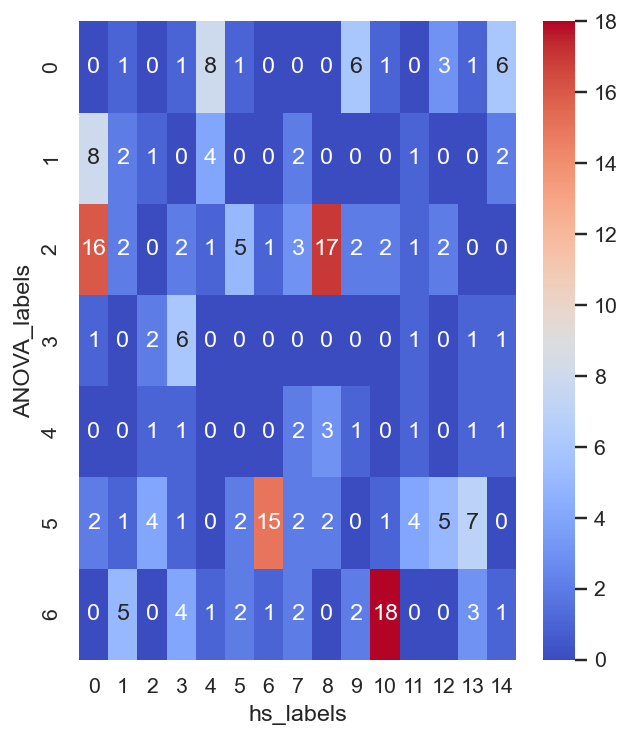

In [55]:
plt.figure(figsize=(5, 6), dpi=70)
sns.set(font_scale=1)
sns.heatmap(pivot_labels_inter, annot=True, cmap = 'coolwarm', fmt=".0f")
plt.grid(False)

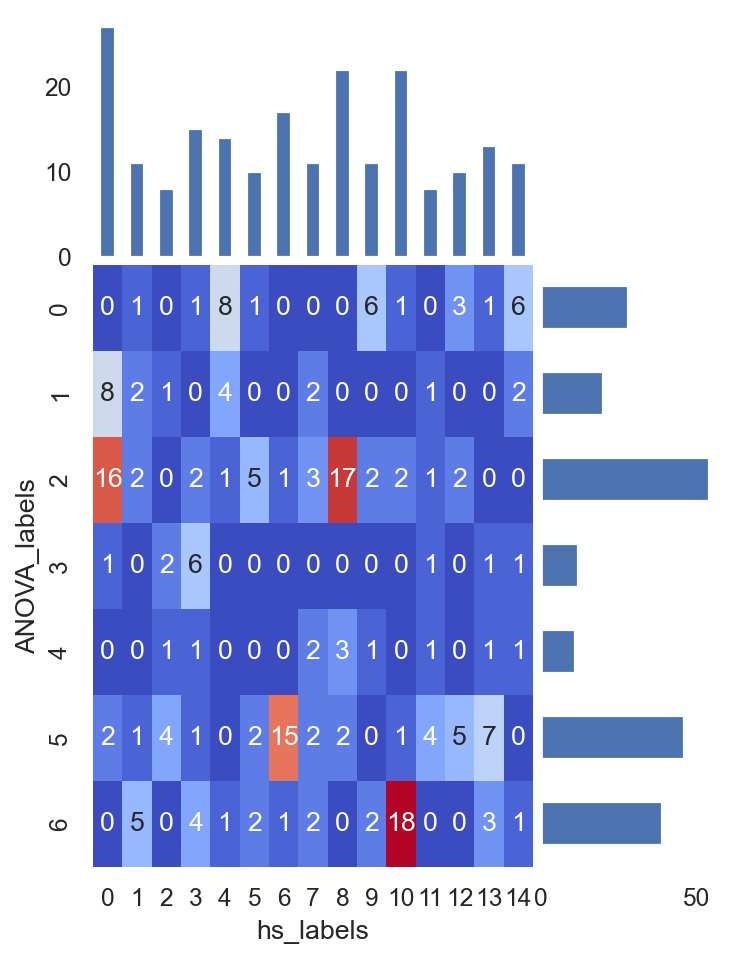

In [56]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = plt.subplots(figsize=(5, 7))
sns.heatmap(pivot_labels_inter, annot=True, cmap = 'coolwarm', fmt=".0f", ax=ax, cbar=False)


divider = make_axes_locatable(ax)
cax = divider.append_axes('top', size='40%', pad=0.05)
pivot_labels_inter.sum(axis=0).plot.bar(ax=cax)
cax.set_facecolor(color='white')
cax.get_xaxis().set_visible(False)

cax = divider.append_axes('right', size='40%', pad=0.05)
index_order = pivot_labels_inter.index[::-1]
pivot_labels_inter.sum(axis=1).loc[index_order].plot.barh(ax=cax)
cax.set_facecolor(color='white')
cax.get_yaxis().set_visible(False)

# Functional analysis

In [57]:
import gseapy
#gseapy.get_library_name()

In [58]:
enr_bg = gseapy.enrichr(gene_list=hs_genes.to_list(),
                        gene_sets=['GO_Biological_Process_2021', 'Azimuth_Cell_Types_2021', 'SynGO_2022', 'KEGG_2021_Human'],
                        outdir=None, # don't write to disk
                       ).results

In [59]:
enr_bg[enr_bg['Adjusted P-value'] < 0.05].index.size

16

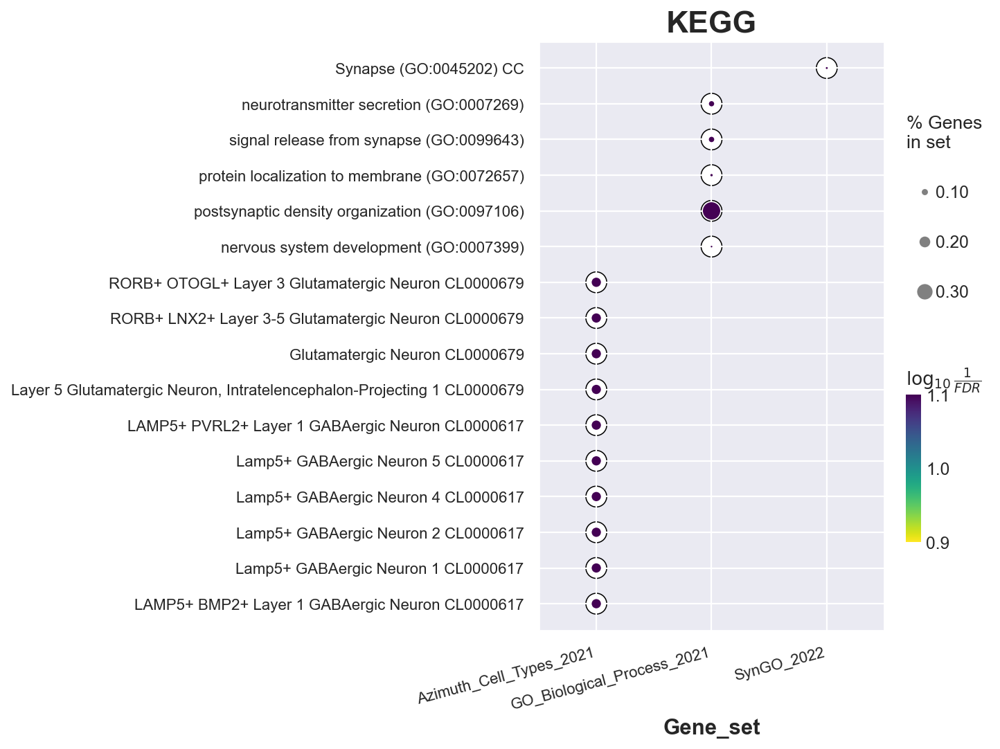

In [60]:
ax = gseapy.dotplot(enr_bg,
              column="Adjusted P-value",
              x='Gene_set', # set x axis, so you could do a multi-sample/library comparsion
              size=5,
              top_term=10,
              figsize=(5,7),
              title = "KEGG",
              xticklabels_rot=15, # rotate xtick labels
              show_ring=True, # set to False to revmove outer ring
              marker='o',
             )

ax.tick_params(axis='both', which='major', labelsize=10)

In [61]:
gene_clust = list()
enrich_results = list()

for label in tqdm(sorted(labels.unique())):
    genes = labels[labels == label].index.tolist()
    descr = f'Genes for spectral clustering ({n_clusters} clusters) of human-specific genes. Cluster label: {label}'
    gene_clust.append(GeneCluster(genes, descr, label, background_genes))
    time.sleep(1)

  0%|          | 0/15 [00:00<?, ?it/s]

## GO_Biological_Process_2021

In [111]:
db_name = 'GO_Biological_Process_2021'
GeneCluster.enrich_geneclusters(gene_clust,db_name )

In [112]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
regulation of resting membrane potential (GO:0060075),1,0.000024,inf,inf,"[ATP1A3, KCNK1]",0.009836,0,0,2,2.007189,0
neuron projection maintenance (GO:1990535),2,0.000239,142.933333,1191.667028,"[APP, ATP1A3]",0.048725,0,0,2,1.312245,0
neuron projection organization (GO:0106027),3,0.000664,71.426667,522.620405,"[APP, ATP1A3]",0.069302,0,0,2,1.159255,0
heterophilic cell-cell adhesion via plasma membrane cell adhesion molecules (GO:0007157),4,0.000851,61.211429,432.682662,"[IGSF21, ALCAM]",0.069302,0,0,2,1.159255,0
cellular response to amyloid-beta (GO:1904646),5,0.000851,61.211429,432.682662,"[APP, ATP1A3]",0.069302,0,0,2,1.159255,0


In [113]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05) & (enrich_res.Rank < 10)].index.unique()
terms.size

36

In [114]:
enrich_res[enrich_res.cluster_label == 5]

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
adenylate cyclase-inhibiting G protein-coupled receptor signaling pathway (GO:0007193),1,0.000407,89.433333,698.084360,"[PSAP, OPRK1]",0.049854,0,0,2,1.302303,5
adenylate cyclase-modulating G protein-coupled receptor signaling pathway (GO:0007188),2,0.001663,41.169231,263.438752,"[PSAP, OPRK1]",0.049854,0,0,2,1.302303,5
negative regulation of cell population proliferation (GO:0008285),3,0.001676,16.113150,102.984968,"[DNAJB2, SH2B3, RNF41]",0.049854,0,0,3,1.302303,5
protein catabolic process (GO:0030163),4,0.001784,39.637037,250.850976,"[SIAH1, RNF41]",0.049854,0,0,2,1.302303,5
regulation of saliva secretion (GO:0046877),5,0.002226,inf,inf,[OPRK1],0.049854,0,0,1,1.302303,5
...,...,...,...,...,...,...,...,...,...,...,...
protein transport (GO:0015031),215,0.341134,2.580725,2.775516,[VLDLR],0.345872,0,0,1,0.461084,5
neutrophil mediated immunity (GO:0002446),216,0.341134,2.580725,2.775516,[PSAP],0.345872,0,0,1,0.461084,5
ubiquitin-dependent protein catabolic process (GO:0006511),217,0.356178,2.442299,2.521248,[SIAH1],0.359460,0,0,1,0.444349,5


In [115]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

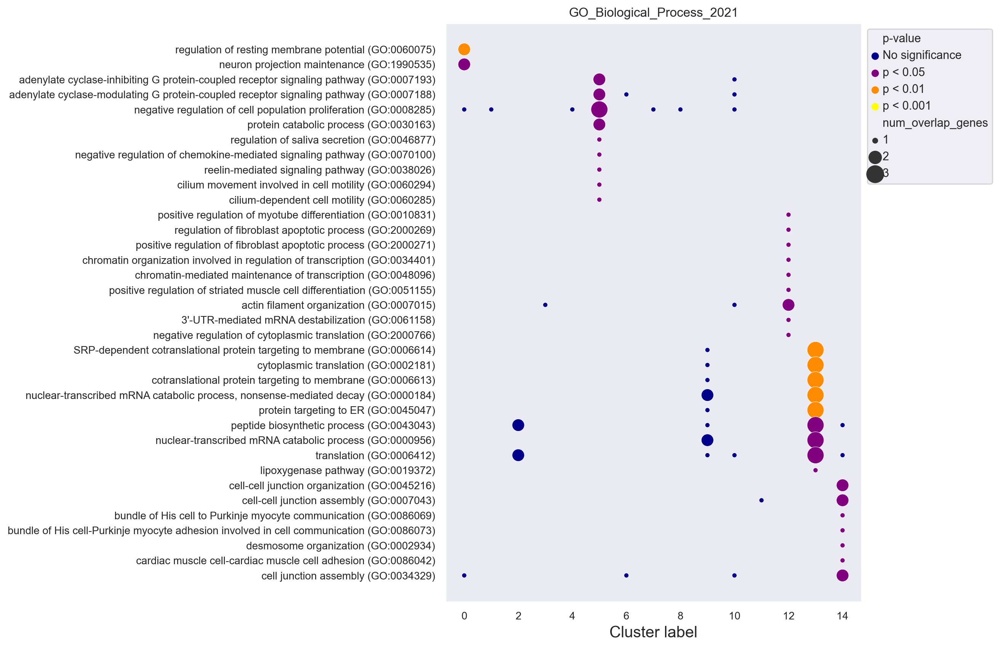

In [116]:
fig = plt.figure(figsize=(7, 10), dpi=100)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Azimuth Cell Types 2021


In [68]:
db_name = 'Azimuth_Cell_Types_2021'
GeneCluster.enrich_geneclusters(gene_clust, db_name)

In [69]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
SST+ OR5AH1P+ Layer 3-5 GABAergic Neuron CL0000617,1,0.009994,206.230769,949.845733,[PCDH9],0.016949,0,0,1,1.770847,0
"Layer 6 Glutamatergic Neuron, Intratelencephalon-Projecting 2 CL0000679",2,0.009994,206.230769,949.845733,[PDE1A],0.016949,0,0,1,1.770847,0
FEZF2+ LPO+ Layer 5-6 Glutamatergic Neuron CL0000679,3,0.009994,206.230769,949.845733,[ALCAM],0.016949,0,0,1,1.770847,0
PVALB+ MEPE+ Layer 5-6 GABAergic Neuron CL0000617,4,0.009994,206.230769,949.845733,[PCDH9],0.016949,0,0,1,1.770847,0
Basophil/Mast 1 CL0000766,5,0.009994,206.230769,949.845733,[GNPTAB],0.016949,0,0,1,1.770847,0


In [70]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05) & (enrich_res.Rank < 10)].index.unique()
terms.size

40

In [71]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

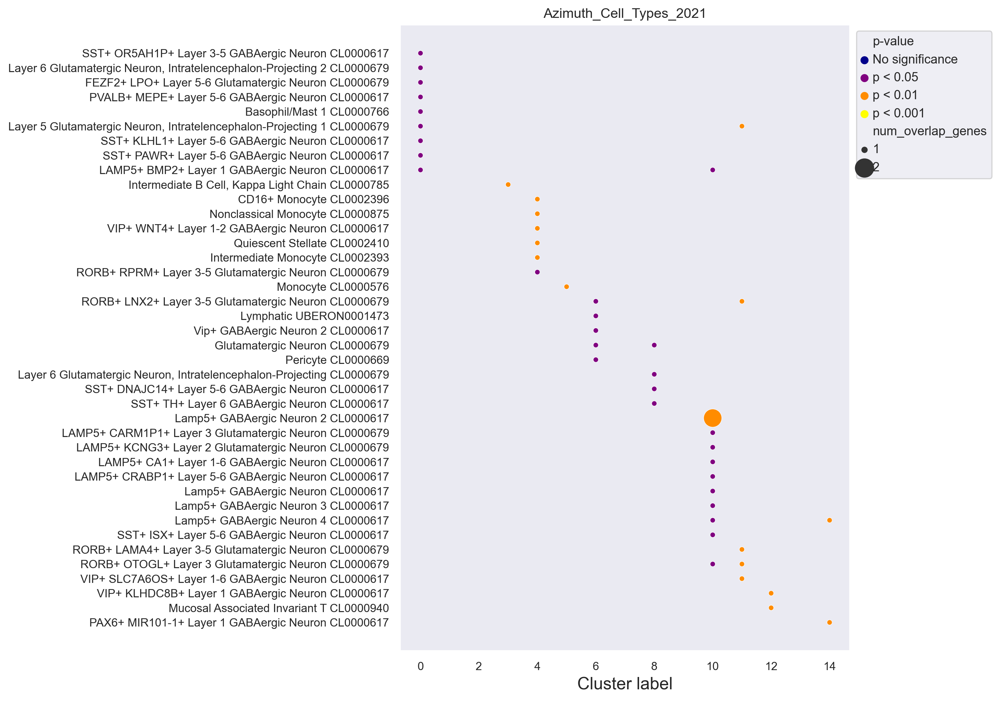

In [72]:
fig = plt.figure(figsize=(7, 10), dpi=120)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Cell types from MTG

In [73]:
# load celltypes from DOI: 10.1126/science.ade9516
cell_types_df = pd.read_csv('results/celltypes.csv')
# Replace incorrect cell-type name
cell_types_df.cluster.replace({'L5/6 IT Car3': 'L6 IT Car3'}, inplace=True)

In [74]:
# load celltype information from DOI: 10.1126/science.ade9516
cell_type_colors = pd.read_csv('results/colors.csv', index_col=2)
cell_type_colors = cell_type_colors['subclass_color']
cell_type_colors.index = cell_type_colors.index.map(lambda x: x[:-2])
cell_type_colors.drop_duplicates(inplace=True)
# replace all non-matching symbols
#cell_type_colors.index = cell_type_colors.index.str.replace(' ', '').str.replace('_', '').str.replace('/', '').str.replace('-', '')

In [75]:
cell_types_df.head()

,species,cluster,gene,avg_log2FC,pct.1,pct.2,p_val,p_val_adj
0,chimp,Astro,A2ML1,0.497248,0.147,0.043,4.130000e-64,2.350000e-59
1,chimp,Astro,AACS,-0.423567,0.085,0.552,8.730000e-148,4.970000e-143
2,chimp,Astro,AAK1,-0.806894,0.604,0.963,3.430000e-191,1.950000e-186
3,chimp,Astro,AASS,1.180879,0.413,0.055,0.000000e+00,0.000000e+00
4,chimp,Astro,AATK,-0.439741,0.068,0.548,1.590000e-160,9.070000e-156


In [76]:
# filter genes
pct_tr = 0.3
lfc_tr = 1.5
rank_tr = 70

filter = ((cell_types_df.species == 'human') & (cell_types_df.avg_log2FC.abs() > lfc_tr) & (cell_types_df['pct.1'] > pct_tr) & (cell_types_df['pct.2'] > pct_tr))
cell_types_df_hum = cell_types_df[filter].copy()
cell_types_df_hum['lfc_abs'] = cell_types_df_hum.avg_log2FC.abs()
cell_types_df_hum['rank'] = cell_types_df_hum.groupby('cluster').lfc_abs.rank()
#cell_types_df_hum[cell_types_df_hum['rank'] < 40].groupby('cluster').gene.count()
marker_gene_count = cell_types_df_hum.groupby('cluster').gene.count().to_frame(name='marker gene count')

cell_types_df_hum = cell_types_df_hum[cell_types_df_hum['rank'] <= rank_tr]
marker_gene_count['after treashold'] =  cell_types_df_hum.groupby('cluster').gene.count()
marker_gene_count

,marker gene count,after treashold
cluster,,
Astro,132,70
Chandelier,60,60
Endo,133,70
L2/3 IT,27,27
L4 IT,23,23
L5 ET,54,54
L5 IT,34,34
L5/6 NP,49,49
L6 CT,50,50


<Axes: xlabel='count', ylabel='cluster'>

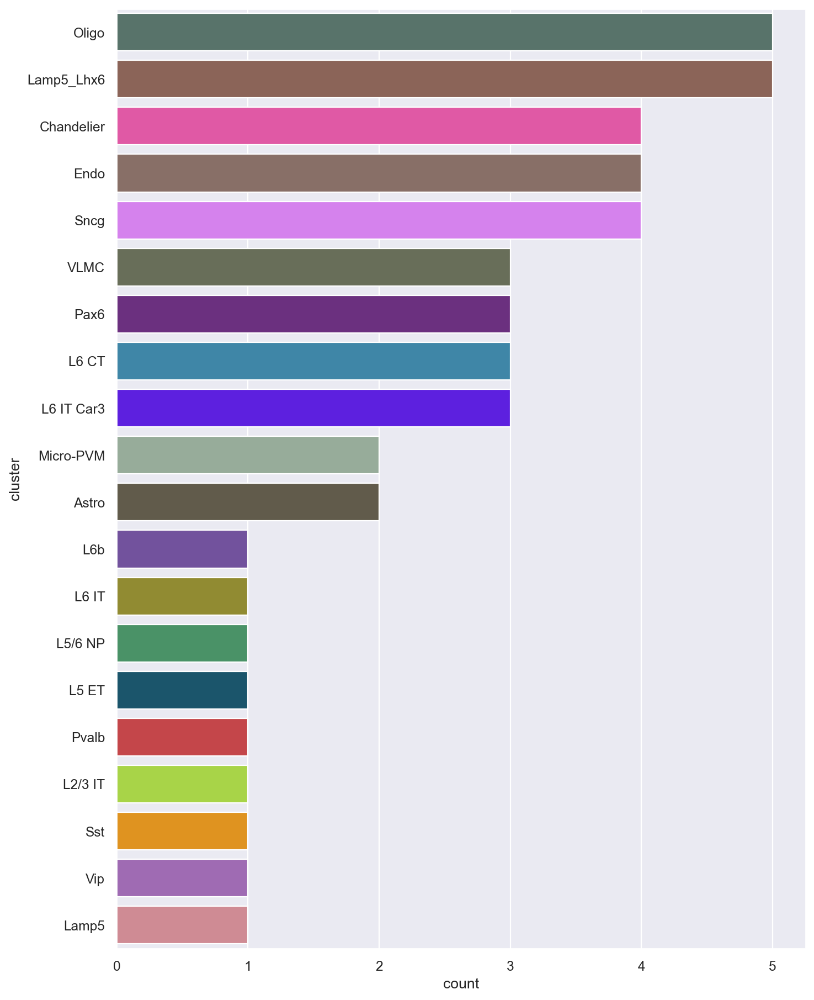

In [77]:
fig, axes = plt.subplots(figsize=(10, 14))

cell_type_colors_pal = cell_type_colors.to_dict()
count_df = cell_types_df_hum[cell_types_df_hum.gene.isin(hs_genes)].cluster.value_counts()
sns.barplot(count_df.to_frame().reset_index(), y='cluster', x='count', ax=axes, palette=cell_type_colors_pal)

In [78]:
index = cell_types_df_hum.cluster.unique()
cluster_celltype = pd.DataFrame(index=index)

for label in sorted(labels.unique()):
    genes = labels[labels == label].index.tolist()
    counts = cell_types_df_hum[cell_types_df_hum.gene.isin(genes)].cluster.value_counts(sort=False)
    cluster_celltype[f'cluster {label}'] = 0
    cluster_celltype.loc[counts.index, f'cluster {label}'] = counts
cluster_celltype.head()

,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4,cluster 5,cluster 6,cluster 7,cluster 8,cluster 9,cluster 10,cluster 11,cluster 12,cluster 13,cluster 14
Astro,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
Chandelier,0,0,0,0,0,0,2,0,1,0,1,0,0,0,0
Endo,0,0,0,0,0,0,0,0,3,0,0,1,0,0,0
L2/3 IT,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
L4 IT,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


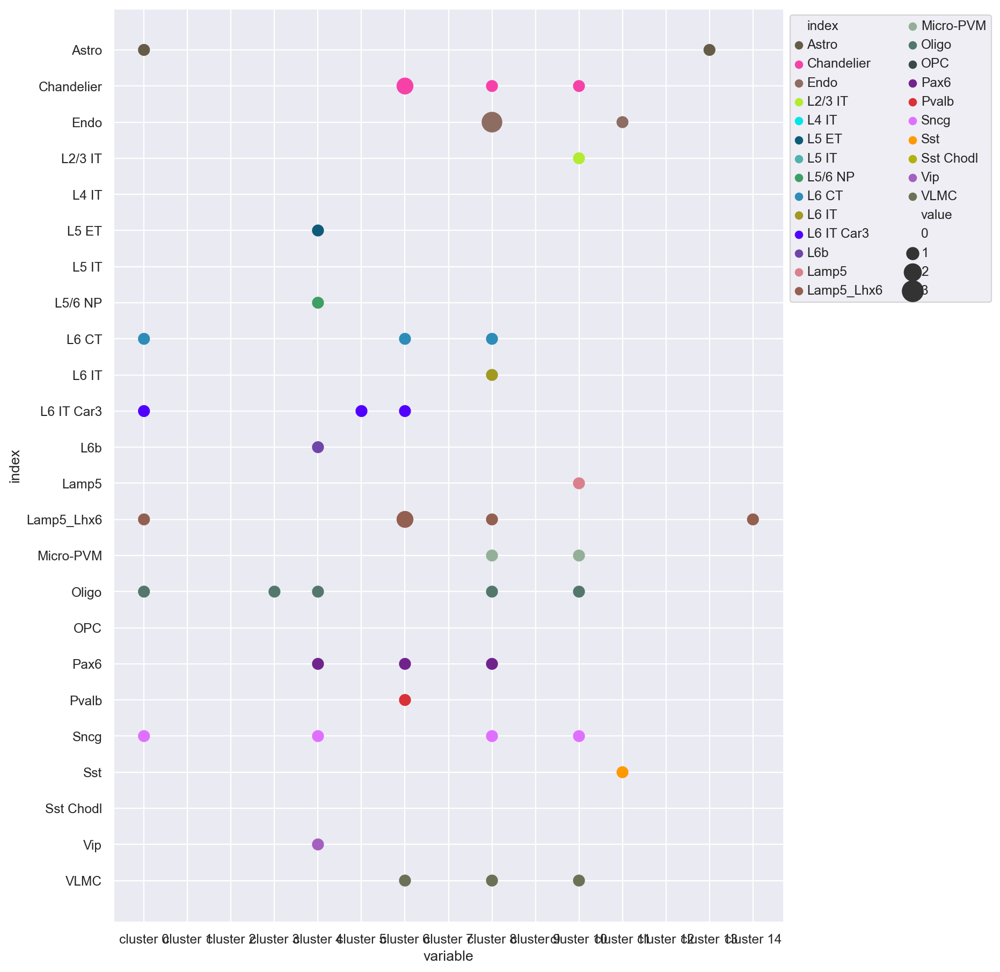

In [79]:
fig, axes = plt.subplots(figsize=(10, 14))
cell_type_count = cluster_celltype.reset_index().melt(id_vars=['index'], value_vars=cluster_celltype.columns)
sns.scatterplot(cell_type_count,
                y='index',
                x='variable',
                size='value',
                palette=cell_type_colors_pal,
                hue='index',
                sizes=(0, 300))
axes.legend(ncols=2, loc="upper left", bbox_to_anchor=(1, 1))
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [80]:
import gseapy
#gseapy.get_library_name()

In [81]:
def enrich_genes(gene_list, gene_sets, label):
    results = gseapy.enrich(gene_list=gene_list, # or gene_list=glist
                           gene_sets=gene_sets, # kegg is a dict object
                           background=background_genes, # or "hsapiens_gene_ensembl", or int, or text file, or a list of genes
                           outdir=None,
                           verbose=True).results
    results[f'cluster_label'] = label
    results['num_overlap_genes'] = results.Overlap.apply(lambda x: x.split('/')[0]).astype(int)
    return results

In [82]:
cell_types_genes = cell_types_df_hum.groupby('cluster').gene.apply(lambda x: list(x)).to_dict()

# check if calculated correctly
assert(cell_types_genes['Astro'] == cell_types_df_hum[cell_types_df_hum.cluster == 'Astro'].gene.to_list())

In [83]:
results = gseapy.enrich(gene_list=labels.index.to_list(), # or gene_list=glist
                           gene_sets=cell_types_genes, # kegg is a dict object
                           background=background_genes, # or "hsapiens_gene_ensembl", or int, or text file, or a list of genes
                           outdir=None,
                           verbose=True).results

2023-11-27 18:00:07,650 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:07,651 [INFO] Run: gs_ind_0 
2023-11-27 18:00:07,662 [INFO] Done.


<Axes: title={'center': 'Cell types'}, xlabel='Combined Score'>

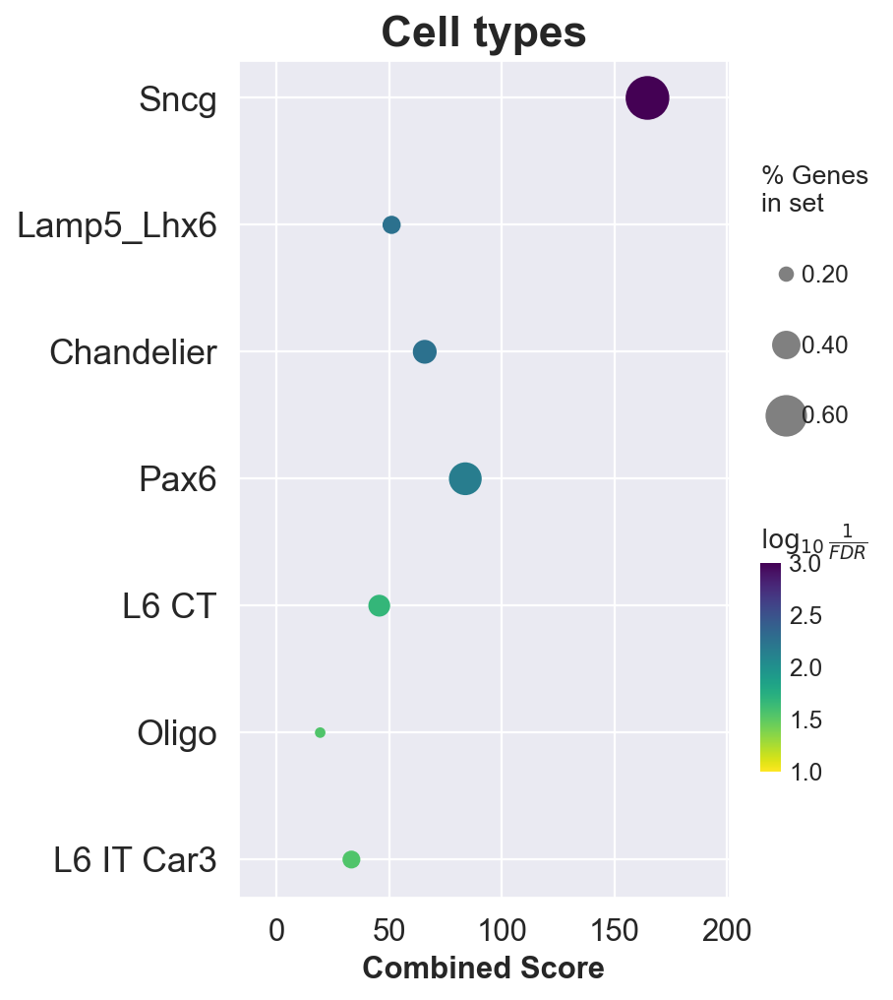

In [84]:
gseapy.dotplot(results, title='Cell types',cmap='viridis_r', size=5, figsize=(5, 7))

In [85]:
enrich_res_list = []
for label in range(n_clusters):
    try:
        enrich_res_list.append(enrich_genes(labels[labels == label].index.tolist(), cell_types_genes, label))
    except:
        print(f'No terms for label {label}')

2023-11-27 18:00:08,268 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,269 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,274 [INFO] Done.
2023-11-27 18:00:08,276 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,277 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,278 [INFO] No hits return, for gene set: Custom2016548995776
2023-11-27 18:00:08,281 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,282 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,283 [INFO] No hits return, for gene set: Custom2016581756224
2023-11-27 18:00:08,285 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,285 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,288 [INFO] Done.
2023-11-27 18:00:08,290 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,291 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,296 [INFO] Done.
2023-11-27 18:00:08,298 [INFO] Input dict object named with gs_ind_0
2023-11-27 18:00:08,299 [INFO] Run: gs_ind_0 
2023-11-27 18:00:08,303 [INFO] Done.


No terms for label 1
No terms for label 2
No terms for label 7
No terms for label 9
No terms for label 12


In [86]:
#enrich_res_list = [enrich_genes(labels[labels == label].index.tolist(), cell_types_genes, label) for label in range(n_clusters)]
enrich_res = pd.concat(enrich_res_list)
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Gene_set,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes,cluster_label,num_overlap_genes
Term,,,,,,,,,
Astro,gs_ind_0,1/22,0.104790,0.125748,13.505660,30.465979,APP,0,1
L6 CT,gs_ind_0,1/9,0.044223,0.107582,32.064548,99.993769,PDE1A,0,1
L6 IT Car3,gs_ind_0,1/11,0.053791,0.107582,26.478261,77.386596,PDE1A,0,1
Lamp5_Lhx6,gs_ind_0,1/18,0.086559,0.125748,16.438042,40.222670,PCDH9,0,1
Oligo,gs_ind_0,1/31,0.144538,0.144538,9.630728,18.627867,ALCAM,0,1


In [87]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05)].index.unique()
terms.size

13

In [88]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

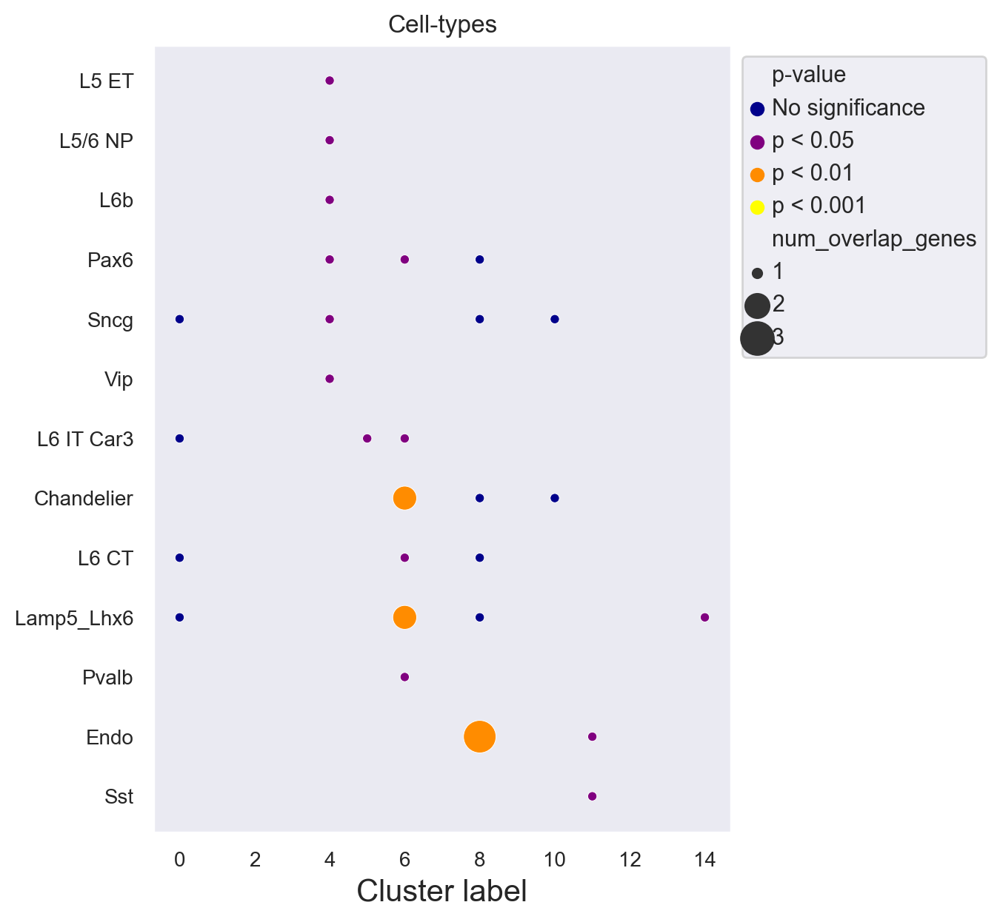

In [89]:
fig = plt.figure(figsize=(5, 7), dpi=100)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title('Cell-types')

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Reactome_2022

In [90]:
db_name = 'Reactome_2022'
GeneCluster.enrich_geneclusters(gene_clust, db_name)

In [91]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
G Alpha (I) Signaling Events R-HSA-418594,1,0.000291,14.869565,121.060248,"[RGS17, APP, PDE1A, ADORA1]",0.043099,0,0,4,1.365538,0
GPCR Downstream Signaling R-HSA-388396,2,0.002438,8.153727,49.057556,"[RGS17, APP, PDE1A, ADORA1]",0.125386,0,0,4,0.901749,0
Neuronal System R-HSA-112316,3,0.003200,7.534315,43.282318,"[GLRB, SYT1, NRXN2, KCNK1]",0.125386,0,0,4,0.901749,0
Signaling By GPCR R-HSA-372790,4,0.003389,7.408978,42.136880,"[RGS17, APP, PDE1A, ADORA1]",0.125386,0,0,4,0.901749,0
Nucleotide-like (Purinergic) Receptors R-HSA-418038,5,0.005009,inf,inf,[ADORA1],0.129453,0,0,1,0.887889,0


In [92]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05)].index.unique()
terms.size

42

In [93]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

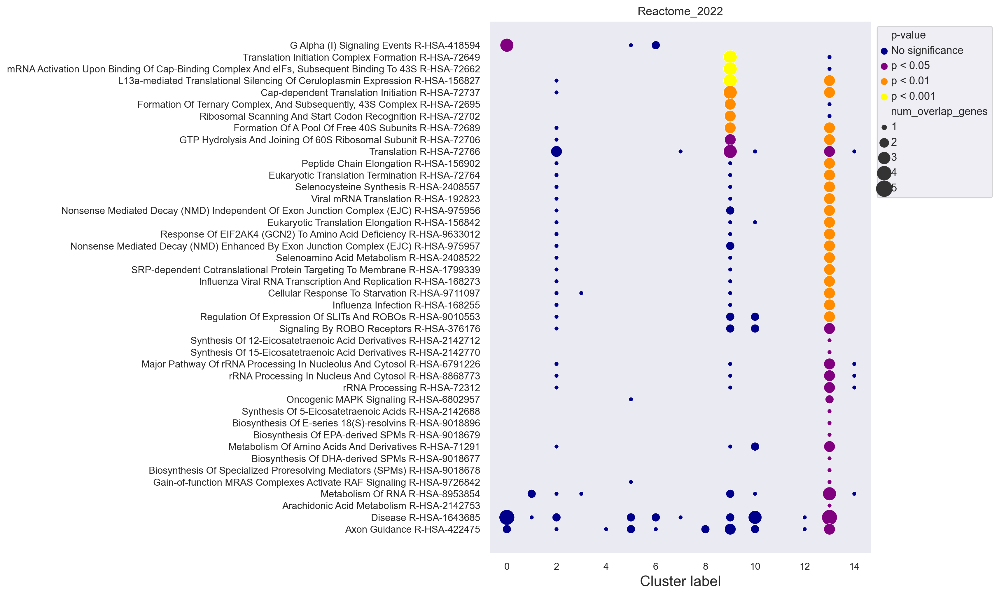

In [94]:
fig = plt.figure(figsize=(7, 10), dpi=120)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## SynGO_2022

In [95]:
db_name = 'SynGO_2022'
GeneCluster.enrich_geneclusters(gene_clust, db_name)

In [96]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
Calcium-Dependent Activation Of Synaptic Vesicle Fusion (GO:0099502) BP,1,0.005009,inf,inf,[SYT1],0.073882,0,0,1,1.131463,0
Integral Component Of Presynaptic Membrane (GO:0099056) CC,2,0.013710,12.538824,53.787362,"[ADORA1, ATP1A3]",0.073882,0,0,2,1.131463,0
Regulation Of Presynaptic Cytosolic Calcium Levels (GO:0099509) BP,3,0.024806,51.528846,190.485847,[ADORA1],0.073882,0,0,1,1.131463,0
Neuronal Dense Core Vesicle (GO:0098992) CC,4,0.024806,51.528846,190.485847,[APP],0.073882,0,0,1,1.131463,0
Presynaptic Modulation Of Chemical Synaptic Transmission (GO:0099171) BP,5,0.029695,41.215385,144.945037,[YWHAH],0.073882,0,0,1,1.131463,0


In [97]:
enrich_res[enrich_res.cluster_label == 2]

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,


In [98]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05)].index.unique()
terms.size

12

In [99]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

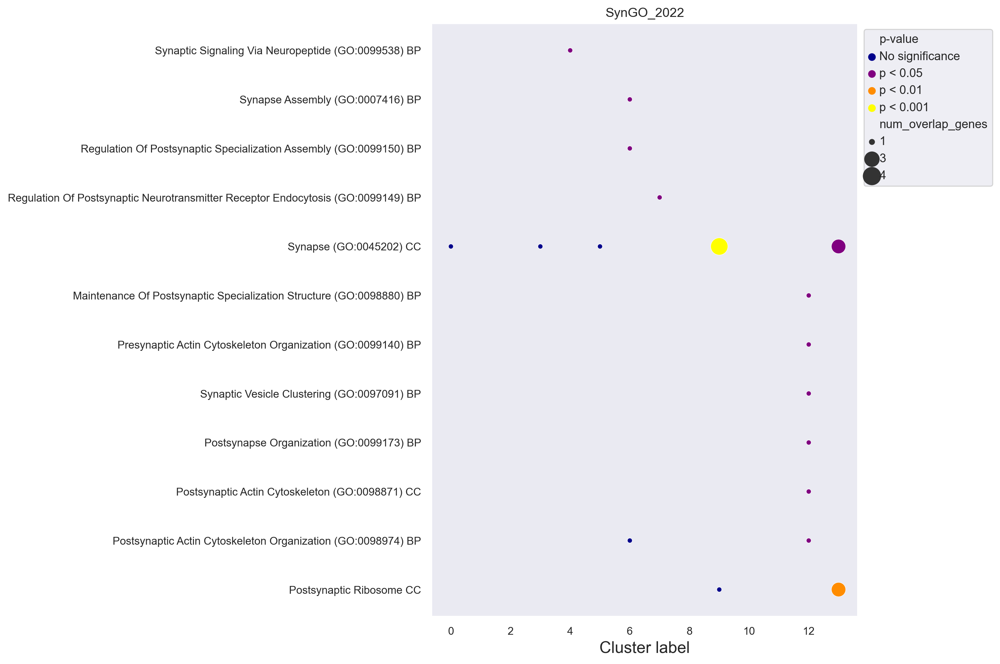

In [100]:
fig = plt.figure(figsize=(7, 10), dpi=120)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## MGI_Mammalian_Phenotype_Level_4_2021

In [101]:
db_name = 'MGI_Mammalian_Phenotype_Level_4_2021'
GeneCluster.enrich_geneclusters(gene_clust, db_name)

In [102]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
abnormal CNS synaptic transmission MP:0002206,1,0.000045,25.034078,250.800668,"[SYT1, STAU2, ADORA1, ATP1A3]",0.008999,0,0,4,2.045819,0
abnormal long term object recognition memory MP:0002801,2,0.000060,51.442308,499.974780,"[APP, PCDH9, ATP1A3]",0.008999,0,0,3,2.045819,0
abnormal gait MP:0001406,3,0.000077,10.355159,98.122287,"[GLRB, GNPTAB, PDE1A, KLHL1, ATP1A3, NRXN2]",0.008999,0,0,6,2.045819,0
increased hematocrit MP:0002608,4,0.000553,22.220833,166.642665,"[STAU2, FBXO9, DKK3]",0.042317,0,0,3,1.373484,0
increased anxiety-related response MP:0001363,5,0.000733,11.484783,82.900936,"[APP, PDE1A, ADORA1, NRXN2]",0.042317,0,0,4,1.373484,0


In [103]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05) & (enrich_res.Rank < 10)].index.unique()
terms.size

41

In [104]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

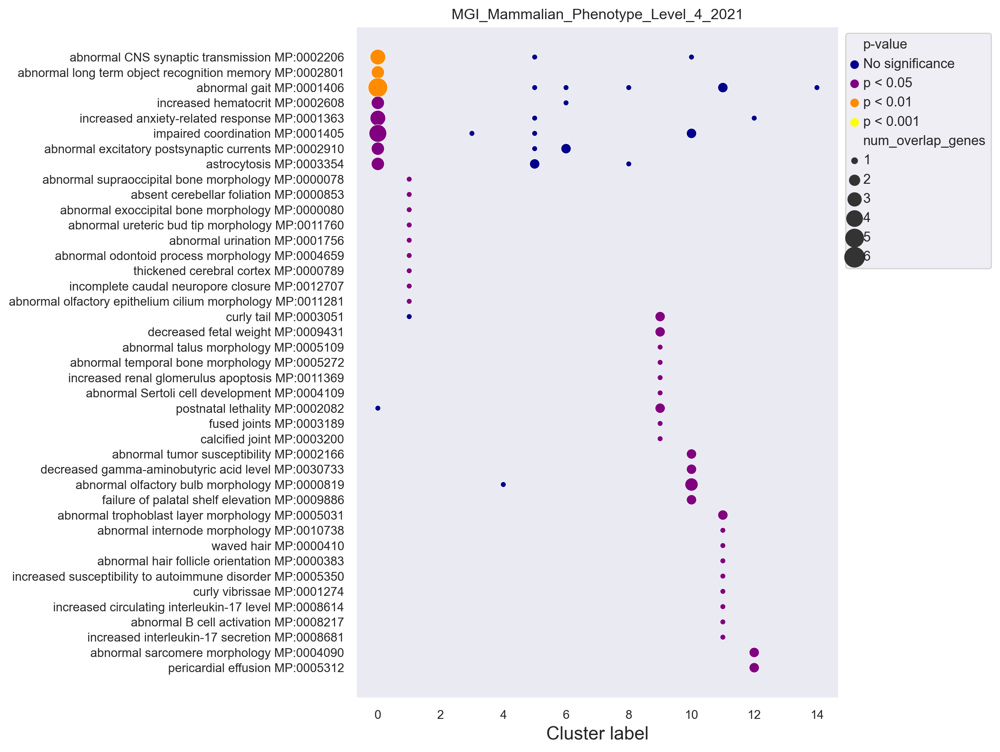

In [105]:
fig = plt.figure(figsize=(7, 10), dpi=120)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## KEGG_2021_Human

In [106]:
db_name = 'KEGG_2021_Human'
GeneCluster.enrich_geneclusters(gene_clust, db_name)

In [107]:
enrich_res = pd.concat([gc.enrichment_res[db_name] for gc in gene_clust])
enrich_res = enrich_res.set_index(['Term'])
enrich_res.head()

,Rank,p-val,Z-score,Combined score,Overlapping genes,Adjusted P-value,Old p-value,Old adjusted p-value,num_overlap_genes,neg_log10(p_adj),cluster_label
Term,,,,,,,,,,,
Renin secretion,1,0.002119,35.673333,219.632417,"[PDE1A, ADORA1]",0.086883,0,0,2,1.061066,0
Morphine addiction,2,0.010276,14.714483,67.362635,"[PDE1A, ADORA1]",0.125903,0,0,2,0.899964,0
Cell adhesion molecules,3,0.011596,13.760000,61.329310,"[ALCAM, NRXN2]",0.125903,0,0,2,0.899964,0
Neuroactive ligand-receptor interaction,4,0.012283,13.327500,58.634610,"[GLRB, ADORA1]",0.125903,0,0,2,0.899964,0
cGMP-PKG signaling pathway,5,0.025538,8.858333,32.488881,"[ADORA1, ATP1A3]",0.197162,0,0,2,0.705177,0


In [108]:
terms = enrich_res[(enrich_res['Adjusted P-value'] < 0.05)].index.unique()
terms.size

3

In [109]:
from pandas.api.types import CategoricalDtype
enrich_res_plot = enrich_res.loc[terms].copy()
cat_type = CategoricalDtype(categories=['No significance', 'p < 0.05', 'p < 0.01', 'p < 0.001'], ordered=True)
enrich_res_plot['p-value'] = enrich_res_plot['Adjusted P-value'].apply(p_val_group).astype(cat_type)
enrich_results.append(enrich_res_plot)

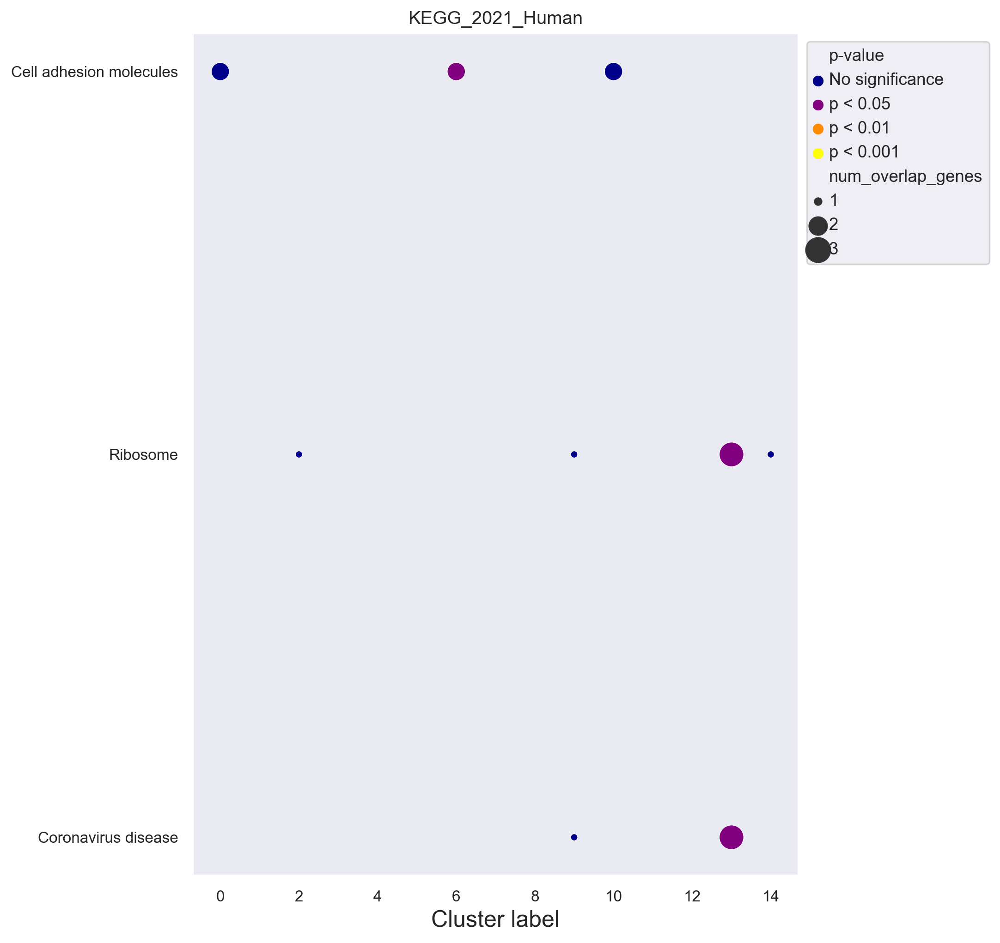

In [110]:
fig = plt.figure(figsize=(7, 10), dpi=120)

ax = sns.scatterplot(
    data=enrich_res_plot.reset_index(),
    x='cluster_label',
    y='Term',
    size='num_overlap_genes',
    sizes=(20, 250),
    hue='p-value',
    palette=color_discrete_map
)

ax.tick_params(labelsize=10)
ax.legend(fontsize=15)
ax.set_xlabel("Cluster label",fontsize=15)
ax.set_ylabel("", fontsize=10)
ax.grid(False)
ax.set_title(db_name)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))